In [19]:
# If R packages are not installed, try:
#install.packages("BiocInstaller",
#  repos="http://bioconductor.org/packages/3.1/bioc")
#source("http://bioconductor.org/biocLite.R")
#biocLite("DESeq2")
#install.packages("RColorBrewer",contriburl = contrib.url("http://cran.us.r-project.org"))
#install.packages("gplots",contriburl = contrib.url("http://cran.us.r-project.org"))

In [2]:
# load necessary R packages
library(DESeq2)
library(RColorBrewer)
library(gplots)

In [3]:
# source these scripts:
source('plotPCAWithSampleNames.R')
source('overLapper_original.R')

In [4]:
# load the data:
data.1<-read.csv("killifish_allcounts.csv")
# show sample names:
#colnames(data.1)
id<-data.1$GeneID
rownames(data.1)<-id
# show first 6 rows of counts data:
#head(data.1)

In [5]:
# load annotation file
annotation<-read.table("kfish2rae5g.annotation.transcript.name.id", fill=TRUE,header=FALSE)
colnames(annotation)<-c("id","gene")
#head(annotation)
# need to fix this so all gene name words are in one column

In [7]:
# separate only F_diaphanus data
F_parvapinis<-data.1[,c(78:85)]
#colnames(F_parvapinis)
col.names<-colnames(F_parvapinis)
#head(F_parvapinis)

In [8]:
conditions = sapply(strsplit(col.names,"_"),`[`,4)
genus = sapply(strsplit(col.names,"_"),`[`,1)
species = sapply(strsplit(col.names,"_"),`[`,2)
genus_species = paste(genus,species,sep="_")
pop = sapply(strsplit(col.names,"_"),`[`,3)
genus_species_pop = paste(genus_species,pop,sep=".")
genus_species = gsub(".NA", "", genus_species_pop)
ExpDesign <- data.frame(row.names=colnames(F_parvapinis), condition = conditions,genus_species = genus_species)
ExpDesign


,condition,genus_species
F_parvapinis_NA_BW_1,BW,F_parvapinis
F_parvapinis_NA_BW_2,BW,F_parvapinis
F_parvapinis_NA_BW_3,BW,F_parvapinis
F_parvapinis_NA_FW_1,FW,F_parvapinis
F_parvapinis_NA_FW_2,FW,F_parvapinis
F_parvapinis_NA_FW_3,FW,F_parvapinis
F_parvapinis_NA_transfer_1,transfer,F_parvapinis
F_parvapinis_NA_transfer_2,transfer,F_parvapinis


estimating size factors
estimating dispersions
gene-wise dispersion estimates
mean-dispersion relationship
final dispersion estimates
fitting model and testing

Attaching package: ‘genefilter’

The following object is masked from ‘package:base’:

    anyNA



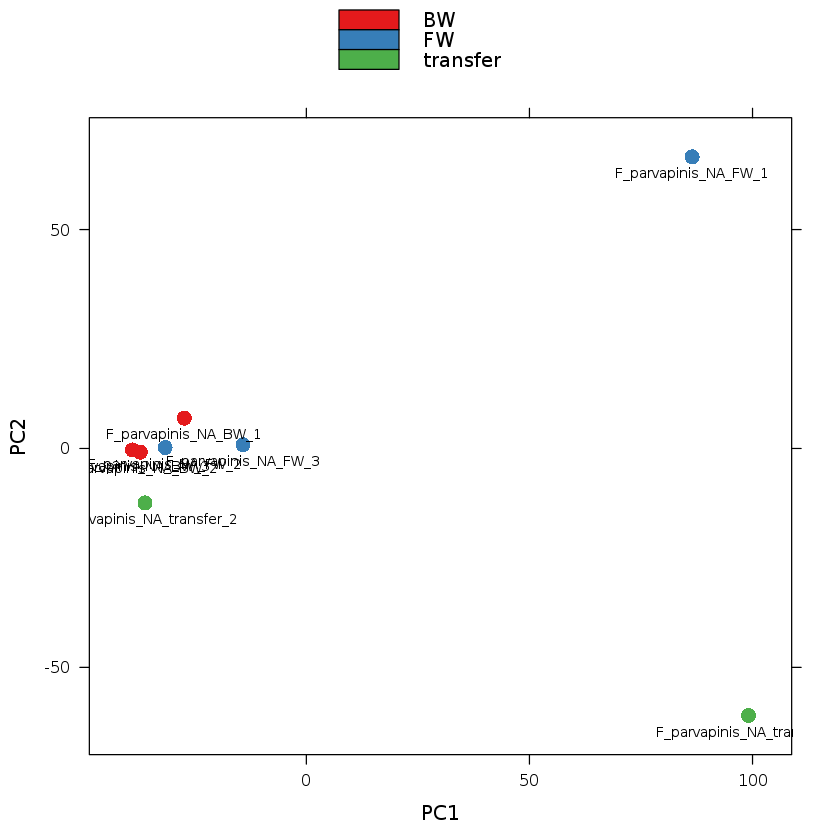

In [9]:
cds<-DESeqDataSetFromMatrix(countData=F_parvapinis, 
                            colData=ExpDesign,design= ~ condition)
cds<-DESeq(cds, betaPrior=FALSE)
log_cds<-rlog(cds)
plotPCAWithSampleNames(log_cds,intgroup="condition",ntop=40000)


In [10]:
res.1<-results(cds,contrast=c("condition","BW","FW"))
#dim(res.1)
res.2<-results(cds,contrast=c("condition","transfer","FW"))
res.3<-results(cds,contrast=c("condition","transfer","BW"))
res1_ordered <-as.data.frame(res.1[order(res.1$padj),])
#dim(res1_ordered)
res1_filtered <-subset(res1_ordered,res1_ordered$padj<0.05)
res1_filtered <-subset(res1_filtered,res1_filtered$log2FoldChange>1 | res1_filtered$log2FoldChange< -1)
id<-rownames(res1_filtered)
res1_filtered<-cbind(res1_filtered,id)
dim(res1_filtered)
res2_ordered <-as.data.frame(res.2[order(res.2$padj),])
res2_filtered<-subset(res2_ordered,res2_ordered$padj<0.05)
res2_filtered <-subset(res2_filtered,res2_filtered$log2FoldChange>1 | res2_filtered$log2FoldChange< -1)
id<-rownames(res2_filtered)
res2_filtered<-cbind(res2_filtered,id)
dim(res2_filtered)
res3_ordered<-as.data.frame(res.3[order(res.3$padj),])
res3_filtered<-subset(res3_ordered,res3_ordered$padj<0.05)
res3_filtered <-subset(res3_filtered,res3_filtered$log2FoldChange>1 | res3_filtered$log2FoldChange< -1)
id<-rownames(res3_filtered)
res3_filtered<-cbind(res3_filtered,id)
dim(res3_filtered)

[1] 36  7

[1] 27  7

[1] 59  7

In [11]:
# get normalized counts
# add id column
F_parvapinis_norm_counts<-counts(cds,normalized=TRUE)
id<-rownames(F_parvapinis_norm_counts)
F_parvapinis_norm_counts<-cbind(F_parvapinis_norm_counts,id)

In [12]:
# merge res1, res2, res3 with counts
# "BW","FW"
res1_df<-as.data.frame(res.1)
colnames(res1_df)<-paste(colnames(res1_df),"BW_FW", sep='.')
id<-rownames(res1_df)
res1_df<-cbind(res1_df,id)
# "transfer","FW"
res2_df<-as.data.frame(res.2)
colnames(res2_df)<-paste(colnames(res2_df),"transfer_FW", sep='.')
id<-rownames(res2_df)
res2_df<-cbind(res2_df,id)
# "transfer","BW"
res3_df<-as.data.frame(res.3)
colnames(res3_df)<-paste(colnames(res3_df),"transfer_BW", sep='.')
id<-rownames(res3_df)
res3_df<-cbind(res3_df,id)
F_parvapinis_res<-merge(F_parvapinis_norm_counts,res1_df,by="id")
F_parvapinis_res<-merge(F_parvapinis_res,res2_df,by="id")
F_parvapinis_res<-merge(F_parvapinis_res,res3_df,by="id")
dim(F_parvapinis_res)
F_parvapinis_res<-F_parvapinis_res[complete.cases(F_parvapinis_res),]
dim(F_parvapinis_res)
F_parvapinis_annotated<-merge(F_parvapinis_res,annotation,by="id")
F_parvapinis_annotated<-F_parvapinis_annotated[,c(ncol(F_parvapinis_annotated),1:(ncol(F_parvapinis_annotated)-1))]
#write.csv(F_parvapinis_annotated,"F_parvapinis_results_all.csv")

[1] 32658    27

[1] 9998   27

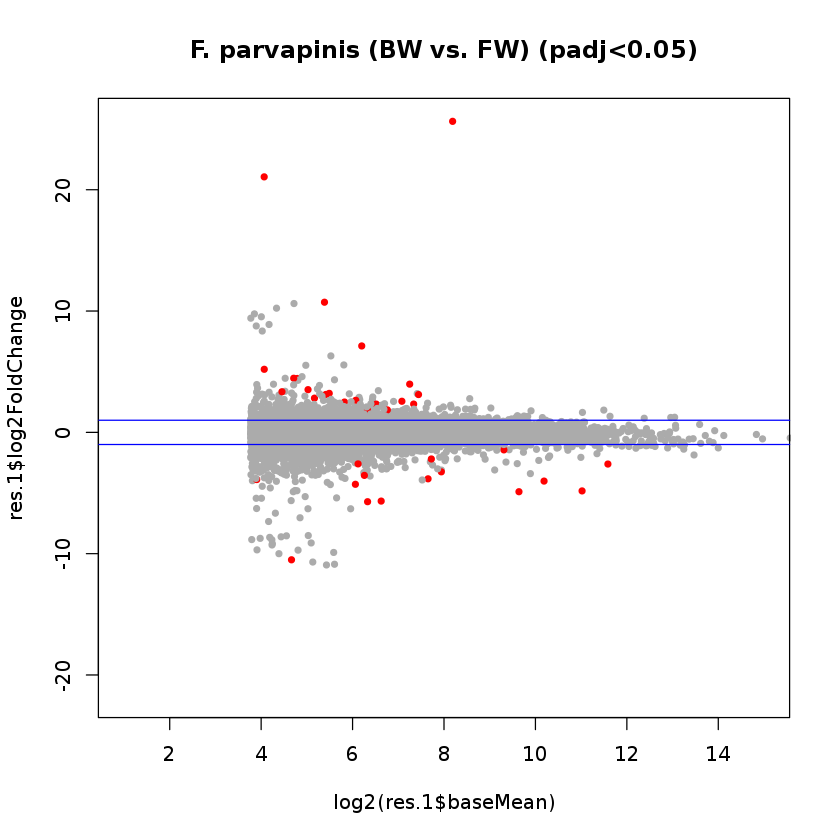

In [13]:
plot(log2(res.1$baseMean), res.1$log2FoldChange, 
     col=ifelse(res.1$padj < 0.05, "red","gray67"),
     main="F. parvapinis (BW vs. FW) (padj<0.05)",xlim=c(1,15),pch=20,cex=1)
abline(h=c(-1,1), col="blue")

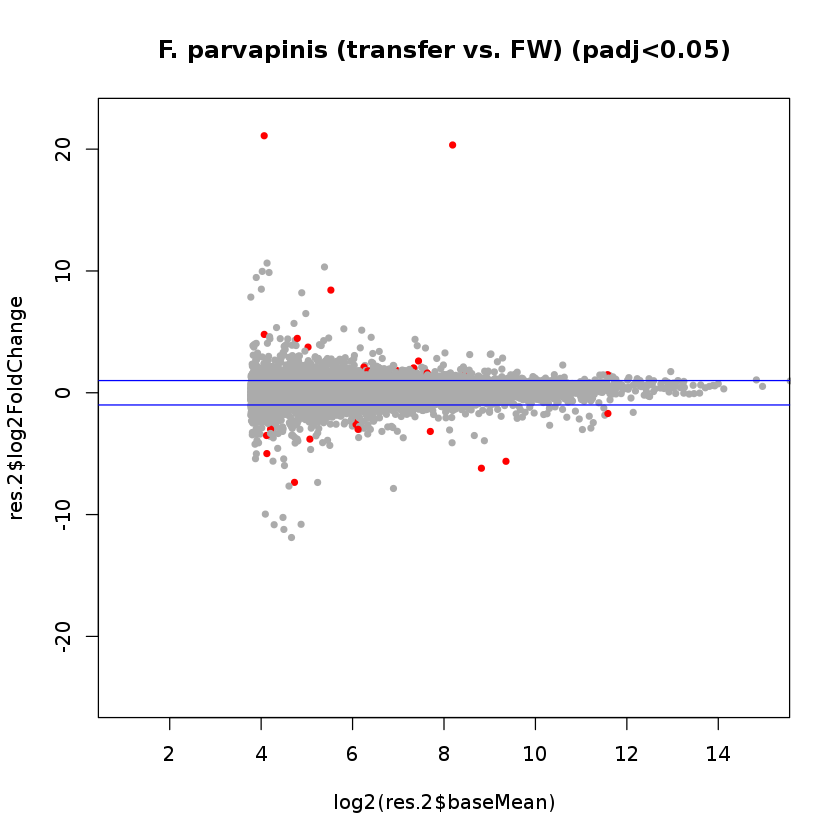

In [14]:
plot(log2(res.2$baseMean), res.2$log2FoldChange, 
     col=ifelse(res.2$padj < 0.05, "red","gray67"),
     main="F. parvapinis (transfer vs. FW) (padj<0.05)",xlim=c(1,15),pch=20,cex=1)
abline(h=c(-1,1), col="blue")

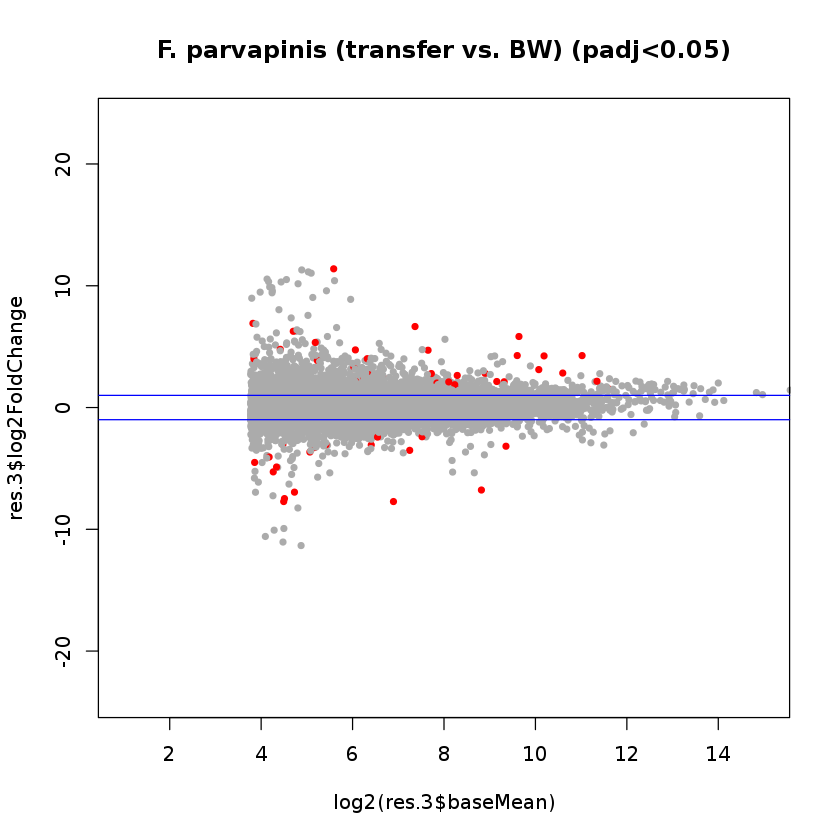

In [15]:
plot(log2(res.3$baseMean), res.3$log2FoldChange, 
     col=ifelse(res.3$padj < 0.05, "red","gray67"),
     main="F. parvapinis (transfer vs. BW) (padj<0.05)",xlim=c(1,15),pch=20,cex=1)
abline(h=c(-1,1), col="blue")

[1] 36

[1] 27

[1] 59

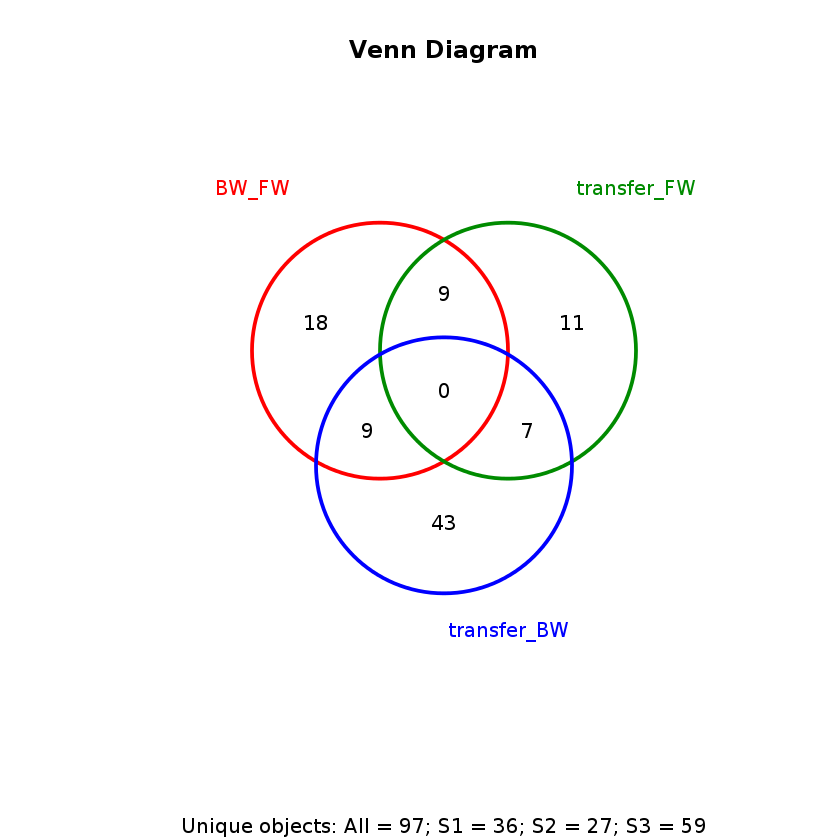

In [16]:
m<-res1_filtered$id
length(m)
n<-res2_filtered$id
length(n)
o<-res3_filtered$id
length(o)
setlist <- list(BW_FW=as.vector(m),transfer_FW=as.vector(n),transfer_BW=as.vector(o))
OLlist <- overLapper(setlist=setlist, sep="", type="vennsets")
counts <- sapply(OLlist$Venn_List, length)
vennPlot(counts=counts)

In [17]:
# extract intersections:
names(OLlist$Venn_List)
overlap_BW_FWtransfer_FW<-OLlist$Venn_List$BW_FWtransfer_FW
length(overlap_BW_FWtransfer_FW)
overlap_BW_FWtransfer_BW<-OLlist$Venn_List$BW_FWtransfer_BW
length(overlap_BW_FWtransfer_BW)
overlap_transfer_FWtransfer_BW<-OLlist$Venn_List$transfer_FWtransfer_BW
length(overlap_transfer_FWtransfer_BW)

# get lists of unique genes for each comparison
F_parvapinis_BW_FW<-OLlist$Venn_List$BW_FW
length(F_parvapinis_BW_FW)
F_parvapinis_transfer_FW<-OLlist$Venn_List$transfer_FW
length(F_parvapinis_transfer_FW)
F_parvapinis_transfer_BW<-OLlist$Venn_List$transfer_BW
length(F_parvapinis_transfer_BW)

[1] "BW_FW"                       "transfer_FW"                
[3] "transfer_BW"                 "BW_FWtransfer_FW"           
[5] "BW_FWtransfer_BW"            "transfer_FWtransfer_BW"     
[7] "BW_FWtransfer_FWtransfer_BW"

[1] 9

[1] 9

[1] 7

[1] 18

[1] 11

[1] 43